In [1]:
#clone YOLOv5 and 
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
%pip install -qr requirements.txt # install dependencies
%pip install -q roboflow

import torch
import os
from IPython.display import Image, clear_output  # to display images

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Cloning into 'yolov5'...
remote: Enumerating objects: 13056, done.
remote: Counting objects: 100% (54/54), done.
remote: Compressing objects: 100% (41/41), done.
remote: Total 13056 (delta 24), reused 33 (delta 13), pack-reused 13002
Receiving objects: 100% (13056/13056), 12.64 MiB | 16.40 MiB/s, done.
Resolving deltas: 100% (8934/8934), done.
/content/yolov5
     |████████████████████████████████| 596 kB 33.8 MB/s 
     |████████████████████████████████| 1.6 MB 58.8 MB/s 
     |████████████████████████████████| 145 kB 36.0 MB/s 
     |████████████████████████████████| 178 kB 17.3 MB/s 
     |████████████████████████████████| 1.1 MB 62.4 MB/s 
     |████████████████████████████████| 67 kB 5.9 MB/s 
     |████████████████████████████████| 54 kB 2.8 MB/s 
     |████████████████████████████████| 138 kB 72.6 MB/s 
     |████████████████████████████████| 62 kB 1.6 MB/s 
Setup complete. Using torch 1.12.1+cu113 (Tesla T4)


In [2]:
# Get dataset from roboflow
from roboflow import Roboflow
rf = Roboflow(api_key="zJ4C6mxwX5d5ea4G9Tvu")
project = rf.workspace("yash-sawant").project("car-dent-detection2")
dataset = project.version(1).download("yolov5")

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to car-dent-detection2-1 in yolov5pytorch:: 100%|██████████| 7504/7504 [00:02<00:00, 2686.76it/s]


In [3]:
from roboflow import Roboflow
rf = Roboflow(model_format="yolov5", notebook="ultralytics")

upload and label your dataset, and get an API KEY here: https://app.roboflow.com/?model=yolov5&ref=ultralytics


In [4]:
!python train.py --img 416 --batch 16 --epochs 100 --data /content/yolov5/car-dent-detection2-1/data.yaml --weights yolov5s.pt --cache

train: weights=yolov5s.pt, cfg=, data=/content/yolov5/car-dent-detection2-1/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=100, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.1-395-g4d05472 Python-3.7.13 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0,

In [5]:
# Show training result.
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

In [8]:
# Prediction
!python detect.py --weights /content/yolov5/runs/train/exp/weights/best.pt --img 416 --conf 0.2 --source /content/yolov5/car-dent-detection2-1/valid/images

detect: weights=['/content/yolov5/runs/train/exp/weights/best.pt'], source=/content/yolov5/car-dent-detection2-1/valid/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.2, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.1-395-g4d05472 Python-3.7.13 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model summary: 213 layers, 7055974 parameters, 0 gradients, 15.9 GFLOPs
image 1/558 /content/yolov5/car-dent-detection2-1/valid/images/0118_JPEG_jpg.rf.1904370168c8e99911cd807127c5bdd0.jpg: 416x416 2 RunningBoard-Dents, 1 fender-dent, Done. (0.009s)
image 2/558 /content/yolov5/car-dent-detection2-1/valid/images/0159_JPEG_jpg.rf.7744a13edd32c522106e612d8fe44200.jpg: 416x416 3 RunningB

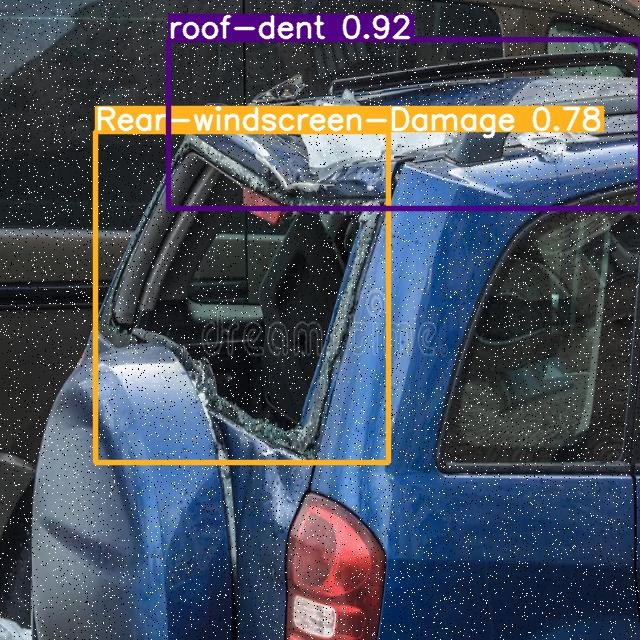

In [10]:
#display inference on ALL test images

import glob
from IPython.display import Image, display

i = 0

# Choose the correct exp folder - see prev output block
for imageName in glob.glob('/content/yolov5/runs/detect/exp3/*.jpg'): #assuming JPG
    i += 1

    if i == 8:
      display(Image(filename=imageName))
      print("\n")

In [11]:
import cv2
from PIL import Image

# Load the model
model_loaded = torch.hub.load('ultralytics/yolov5', 'custom', path='/content/car_damage_yolov5.pt')

image_path = '/content/resources/valid.jpeg'
image = Image.open(image_path)
images = [image]

# Inference
results = model_loaded(images, size=640)

# Results
results.print()

You are about to download and run code from an untrusted repository. In a future release, this won't be allowed. To add the repository to your trusted list, change the command to {calling_fn}(..., trust_repo=False) and a command prompt will appear asking for an explicit confirmation of trust, or load(..., trust_repo=True), which will assume that the prompt is to be answered with 'yes'. You can also use load(..., trust_repo='check') which will only prompt for confirmation if the repo is not already trusted. This will eventually be the default behaviour
Downloading: "https://github.com/ultralytics/yolov5/zipball/master" to /root/.cache/torch/hub/master.zip
INFO:yolov5:requirements: matplotlib>=3.2.2 not found and is required by YOLOv5, attempting auto-update...
requirements: matplotlib>=3.2.2 not found and is required by YOLOv5, attempting auto-update...
INFO:yolov5:Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/

Looking in indexes: htt

image 1/1: 1279x1706 1 front-bumper-dent
Speed: 41.8ms pre-process, 13.7ms inference, 1.6ms NMS per image at shape (1, 3, 480, 640)


In [15]:
results.pandas().xyxy[0]

,xmin,ymin,xmax,ymax,confidence,class,name
0,750.007874,347.698242,1700.942017,1230.452759,0.618864,11,front-bumper-dent


In [36]:
# Prediction
!python detect.py --weights /content/car_damage_yolov5.pt --img 416 --conf 0.2 --source /content/resources/valid.jpeg

detect: weights=['/content/car_damage_yolov5.pt'], source=/content/resources/valid.jpeg, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.2, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.1-395-g4d05472 Python-3.7.13 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model summary: 213 layers, 7055974 parameters, 0 gradients, 15.9 GFLOPs
image 1/1 /content/resources/valid.jpeg: 320x416 1 front-bumper-dent, Done. (0.017s)
Speed: 0.5ms pre-process, 17.3ms inference, 1.7ms NMS per image at shape (1, 3, 416, 416)
Results saved to runs/detect/exp


/content/yolov5/runs/detect/exp/valid.jpeg


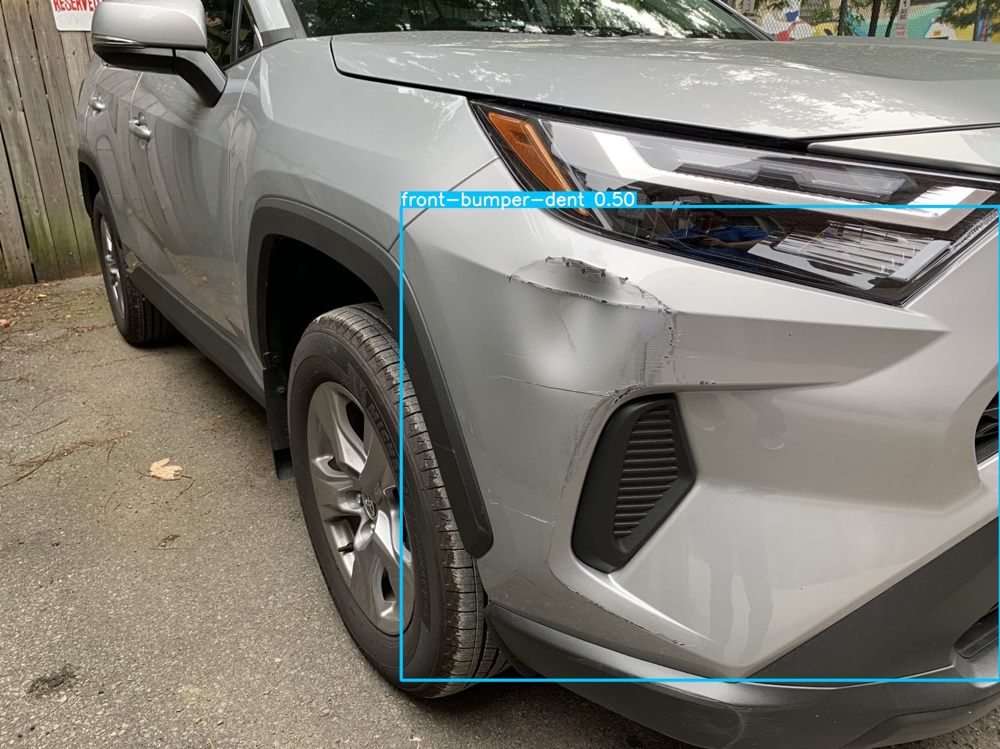

In [37]:
#display inference on ALL test images

import glob
from IPython.display import Image, display

# Choose the correct exp folder - see prev output block
list_with_boxes = glob.glob('/content/yolov5/runs/detect/exp*/valid.jpeg')
latest_image_with_boxes = max(list_with_boxes, key=os.path.getctime)
print(latest_image_with_boxes)
display(Image(filename=latest_image_with_boxes))
print('\n')